### Questions

* Are there vaguadas detectable in the data that are not reproduced by WRF or reanalyses?
* Are there some vaguadas better captured by the model than others? (What's the variance *within* the set of vaguada events?)

In [144]:
import sys, os
sys.path.append('../python/')
import pandas as pd
import numpy as np
import xarray as xr
import scipy.signal as sig
import matplotlib.pyplot as plt
import matplotlib.gridspec as gs
import matplotlib as mpl
import cartopy.crs as crs
from sklearn.cluster import KMeans
from datetime import datetime
import helpers as hh
from filters import Lanczos
from formulae import wind
from data.WRF import align_stations
from plots import Coquimbo

In [3]:
%matplotlib nbagg

In [420]:
from IPython.display import set_matplotlib_formats
%matplotlib inline
set_matplotlib_formats('png', 'pdf')

In [64]:
def composite(var, locs, window, fillna=False):
    ar = lambda x: np.array(x, dtype='datetime64', ndmin=2)
    dt = pd.Timedelta(window)
    n = dt / var.index.freq.delta
    i = np.abs(ar(var.index).T - ar(locs)) <= dt.asm8
    k = i.sum(0) == 2 * n + 1
    # don't take any event too close to the edge
    i = np.expand_dims(i[:, k], 2).transpose(2, 1, 0)
    x, j = np.broadcast_arrays(np.expand_dims(var, 2).transpose(1, 2, 0), i)
    c = x[j].reshape((var.shape[1], i.shape[1], -1))
    if fillna:
        j = np.isnan(c)
        c[j] = np.nanmean(c, 1, keepdims=True).repeat(c.shape[1], 1)[j]
    return xr.DataArray(c, coords=[
        ('var', var.columns), ('events', locs[k]), ('dt', np.arange(-n, n+1))])

def label(full_idx, partial_idx):
    i = np.zeros(full_idx.size, dtype=int)
    i[full_idx.get_indexer(partial_idx)] = 1
    return i


# relabel KMeans labels according to cluster center ordering (i.e. from low to high cloud-top temps)
def relabel(km):
    l = np.empty_like(km.labels_)
    for i, j in enumerate(km.cluster_centers_.flatten().argsort()):
        l[km.labels_==j] = i
    return l

In [2]:
with pd.HDFStore('../../data/CEAZAMet/stations.h5') as S:
    sta= S['stations']

In [11]:
to_day = lambda x: pd.DatetimeIndex(pd.Series(x).dt.round('D'))

In [12]:
slp = xr.open_dataarray('../../data/analyses/ERA/ERA-SLP-dailymean.nc')
# this sets the time from the cdo averaging (18:00h every day) to simply the day
slp['time'] = to_day(slp.time)

# Detection

## By cloud-top temperatures

In [5]:
avhrr = '/sshfs/datos/sata1_ceazalabs/arno/HPC/uvHome/data/AVHRR/'
patmosx = {'N19': 'patmosx_v05r03-preliminary_NOAA-19_asc.nc',
 'N18': 'patmosx_v05r03-preliminary_NOAA-18_asc.nc',
 'M02': 'patmosx_v05r03-preliminary_METOP-02_des.nc',
 'N15': 'patmosx_v05r03-preliminary_NOAA-15_des.nc'}

In [8]:
ds = xr.Dataset({k: xr.open_dataset(os.path.join(avhrr, f))['cld_temp_acha'] 
                 for k, f in patmosx.items()}).sortby('time')
clouds = ds.resample(time='D').mean('time').to_array().mean('variable')

/home/arno/Documents/code/conda/envs/bayes/lib/python3.6/site-packages/xarray/core/common.py:594: FutureWarning: pd.TimeGrouper is deprecated and will be removed; Please use pd.Grouper(freq=...)
  label=label, base=base)


In [9]:
def extract(x, loc=sta.loc['PLV'], n=10):
    i = x.indexes['longitude'].get_loc(float(loc.lon), 'nearest')
    j = x.indexes['latitude'].get_loc(float(loc.lat), 'nearest')
    y = x.isel(longitude=slice(i-n,i+n+1), latitude=slice(j-n, j+n+1)).mean(('longitude', 'latitude'))
    return pd.DataFrame(y.values, index=x.indexes['time'] - pd.Timedelta('4h'), columns=[x.name])

y = pd.concat([extract(ds[k]) for k in ds.data_vars], 1)

In [455]:
p = D['pa_hpa']
p = p[p>980].resample('h') # there are 2 nasty outliers at PLV
pi = p.interpolate().dropna(0, 'any')
p = p.first()

In [26]:
with pd.HDFStore('../../data/CEAZAMet/station_data_new.h5') as S:
    # these are all variables currently of interest
    D = pd.concat([
        S['pa_hpa'][['PLV', 'CNSD']],
        S['vv_ms'].xs('PLV', 1, 'station', drop_level=False),
        S['dv'].xs('PLV', 1, 'station', drop_level=False),    
        S['rs_w'].xs('PLV', 1, 'station', drop_level=False),
        S['ta_c'].xs('PLV', 1, 'station', drop_level=False)
    ], 1).xs('prom', 1, 'aggr').dropna(0, 'all').resample('h').first()
    D.columns = D.columns.swaplevel(0, 1)

D = D['2016':]

# form some derived properties
w10 = Lanczos(D, '10D')
# ws = Lanczos(D, '2D')
u, v = wind(D['vv_ms'], D['dv'])

# remove lowpass variability from pressure at CNSD and u, v winds
X = pd.concat((D[('pa_hpa', 'CNSD')], u, v), 1)
X = X - X.rolling(**w10.roll).apply(w10)

rs = D['rs_w']#.rolling(**ws.roll).apply(ws)# - D['rs_w'].rolling(**w10.roll).apply(w10)
X = pd.concat((D[('pa_hpa', 'PLV')], X, D['ta_c'], rs), 1)
X.columns = ['PLV', 'CNSD', 'u', 'v', 't', 'rs']

p = D['pa_hpa']
p = p[p>980].resample('h') # there are 2 nasty outliers at PLV
pi = p.interpolate().dropna(0, 'any')
p = p.first()

with pd.HDFStore('../python/vaguadas.h5') as S:
    l2 = S['labels2']

/home/arno/Documents/code/conda/envs/bayes/lib/python3.6/site-packages/ipykernel/kernelbase.py:399: PerformanceWarning: indexing past lexsort depth may impact performance.
  user_expressions, allow_stdin)


In [311]:
w1 = Lanczos(p, '1D')
lp = p.rolling(**w1.roll).apply(w1)

iz, = sig.argrelmin(lp['PLV'].values.flatten(), order=5*24)
jz, = sig.argrelmin(lp['PLV'].values.flatten(), order=24)

/home/arno/Documents/code/conda/envs/bayes/lib/python3.6/site-packages/scipy/signal/_peak_finding.py:68: RuntimeWarning: invalid value encountered in less
  results &= comparator(main, plus)
/home/arno/Documents/code/conda/envs/bayes/lib/python3.6/site-packages/scipy/signal/_peak_finding.py:69: RuntimeWarning: invalid value encountered in less
  results &= comparator(main, minus)


In [312]:
x = y.groupby(y.index.date).mean().mean(1)
x.index = x.index.astype('datetime64')
idz = (lambda s: s[s>=0])(x.index.get_indexer(to_day(lp.index[iz])))
jdz = (lambda s: s[s>=0])(x.index.get_indexer(to_day(lp.index[jz])))
ijs = np.intersect1d(idz, jdz)
idl = x.index.get_indexer(l2.index)
idx = lp.index[iz][lp.index[iz].get_indexer(to_day(lp.index[iz]).intersection(x.index), 'nearest')]

km = KMeans(n_clusters=3).fit(x.iloc[idz].values.reshape((-1, 1)))
l1 = relabel(km)

c = composite(X, idx, '1D')

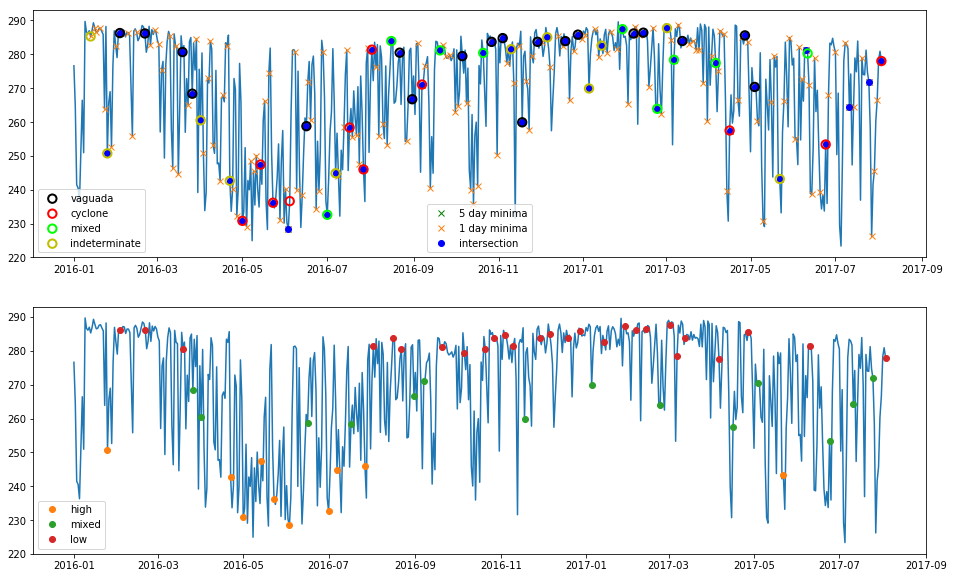

In [77]:
plt.figure(figsize=(16, 10))
plt.subplot(2, 1, 1)
plt.plot(x)
plt.plot(x.iloc[idz], 'xg', label='5 day minima')
plt.plot(x.iloc[jdz], 'x', label='1 day minima')
plt.plot(x.iloc[ijs], 'ob', label='intersection')
plt.scatter(x.index[idl], x.iloc[idl], edgecolors=l2.replace({'v': 'k', 'c': 'r', 'm': 'lime', 'i': 'y'}).values.flatten(),
          marker='o', s=70, facecolors='none', linewidth=2, zorder=10)

plt.gca().add_artist(
    plt.legend([plt.scatter([], [], s=70, edgecolor=c, facecolors='none', linewidth=2) 
                for c in ['k', 'r', 'lime', 'y']], 
               ['vaguada', 'cyclone', 'mixed', 'indeterminate'], loc=3)
)
plt.legend(loc=8)

plt.subplot(2, 1, 2)
plt.plot(x, label='_nolegend_')
for i in np.unique(l1):
    plt.plot((lambda s:s[l1==i])(x.iloc[idz]), 'o')
    
plt.legend(['high', 'mixed', 'low'])

## Composits for distinct event types

In [453]:
def map_common(pl, stations, extent=[-120, -60, -15, -65], color='lime', cbar=None, space=.005, width=.01):
    ax = pl.ax
    for s in stations:
        plt.plot(*sta.loc[s][['lon', 'lat']].as_matrix(), 'o', color=color)
    ax.set_extent(extent)
    ax.coastlines()
    if cbar is not None:
        bb = ax.get_position()
        x = bb.x0 - space - width if cbar=='left' else bb.x1 + space
        cax = ax.figure.add_axes([x, bb.y0, width, bb.y1-bb.y0])
        plt.colorbar(pl, cax=cax)
        cax.yaxis.set_ticks_position(cbar)

def lag_by_label(slp, clouds, idx, gridspec, maj_c=None, min_c=None):
    g = gs.GridSpecFromSubplotSpec(1, 4, subplot_spec=gridspec, wspace=.01)
    ix = idx + pd.Timedelta('4h')
    sm = slp.mean('time')
    
    axes = []
    for j in range(4):
        i = lambda s: s.indexes['time'].get_indexer(ix + pd.Timedelta(j - 2, 'D'), 'nearest')
        x = slp.isel(time=i(slp)).mean('time') - sm
        c = clouds.isel(time=i(clouds)).mean('time')
        
        axes.append(plt.gcf().add_subplot(g[0, j], projection=crs.PlateCarree()))
        im = mpl.image.NonUniformImage(axes[-1], interpolation='bilinear', cmap='viridis',
                                      norm=mpl.colors.Normalize(220, 280))
        im.set_data(c.longitude, c.latitude, c)
        im.set_extent([-120, -60, -65, -15])
        axes[-1].images.append(im)
        if maj_c is None:
            pl = axes[-1].contour(x.lon, x.lat, x, colors=['w'])
        else:
            pl = axes[-1].contour(x.lon, x.lat, x, maj_c, colors=['w'])
        map_common(pl, ['PLV', 'CNSD'], color='magenta')
        
        y = x.sel(lon=slice(-85, -65), lat=slice(-25, -40))
        gin = gs.GridSpecFromSubplotSpec(5, 5, g[0, j])
        bx = plt.gcf().add_subplot(gin[:2, :2], projection=crs.PlateCarree())
        if min_c is None:
            pl = bx.contourf(y.lon, y.lat, y, cmap='PiYG_r')
        else:
            pl = bx.contourf(y.lon, y.lat, y, min_c, cmap='PiYG_r')
        map_common(pl, ['PLV'], extent=[-85, -65, -25, -40], color='b')
        
    axes[2].outline_patch.set_linewidth(4)
    axes[2].outline_patch.set_edgecolor('red')
    
    bb = axes[-1].get_position()
    plt.colorbar(im, cax=plt.gcf().add_axes([bb.x1 + 0.01, bb.y0, 0.01, bb.height]))
    
    bb = axes[0].get_position()
    cax = plt.gcf().add_axes([bb.x0 - 0.02, bb.y0, 0.01, bb.height])
    cb = plt.colorbar(pl, cax=cax)
    cax.yaxis.set_ticks_position('left')
        
def lag_composites(slp, clouds, idx, labels, gridspec, maj_c=[None], min_c=[None]):
    n = np.unique(labels).size
    g = gs.GridSpecFromSubplotSpec(n, 1, subplot_spec=gridspec)
    for i in range(n):
        lag_by_label(slp, clouds, idx[labels==i], g[i], maj_c[min(len(maj_c)-1, i)], min_c[min(len(min_c)-1, i)])
        

def maps(slp, c, labels, contours, gridspec, **kwargs):
    n = len(np.unique(labels))
    g = gs.GridSpecFromSubplotSpec(n, 2, subplot_spec=gridspec, **kwargs)
    mp = slp.mean('time')
    
    for i in range(n):
        ax = plt.gcf().add_subplot(g[i, 0], projection=crs.PlateCarree())
        idx = slp.indexes['time'].get_indexer(c.indexes['events'][labels == i], 'nearest')
        p = slp.isel(time = idx[idx>=0])
        if contours is None:
            pl = plt.contourf(p.lon, p.lat, p.mean('time') - mp, cmap='PiYG_r')
        else:
            pl = plt.contourf(p.lon, p.lat, p.mean('time') - mp, contours[min(len(contours)-1, i)], cmap='PiYG_r')
        
        map_common(pl, ['PLV', 'CNSD'], cbar='left')
        ax.text(-117, -23, 'n = {}'.format((labels==i).sum()))
        
        ax = plt.gcf().add_subplot(g[i, 1], projection=crs.PlateCarree())
        pl = plt.contourf(p.lon, p.lat, p.std('time'), cmap='viridis')
        map_common(pl, ['PLV', 'CNSD'], cbar='right')
        
        
def lines(c, labels, gridspec, **kwargs):
    n, m = c['var'].size, np.unique(km.labels_).size
    g = gs.GridSpecFromSubplotSpec(n, 1, subplot_spec=gridspec, wspace=.2, **kwargs)
    for i in range(n):
        ax = plt.gcf().add_subplot(g[i, :])
        if i<n-1: plt.setp(ax.get_xticklabels(), visible=False)
        
        for j in range(m):
            x = c.isel(var=i, events=labels==j)
            mean = x.mean('events')
            std = x.std('events')
            plt.plot(c['dt'], mean)
            ax.fill_between(c['dt'], mean-std, mean+std, alpha=.2)
        ax.annotate(x['var'].item(), xy=(.03, .1), xycoords='axes fraction')
    
        if i==0:
            plt.legend(['high', 'mixed', 'low'], loc=4)
        

def label_plot(slp, c, labels, maj_c=None, min_c=None, gridspec=None):
    if gridspec is None:
        g = gs.GridSpec(2, 2)
    else:
        g = gs.GridSpecFromSubplotSpec(2, 2, subplot_spec=gridspec)
    lines(c, labels, g[0, 0])
    maps(slp, c, labels, maj_c, g[0, 1], wspace=0.02)
    lag_composites(slp, clouds, c.indexes['events'], labels, g[1, :], maj_c, min_c)

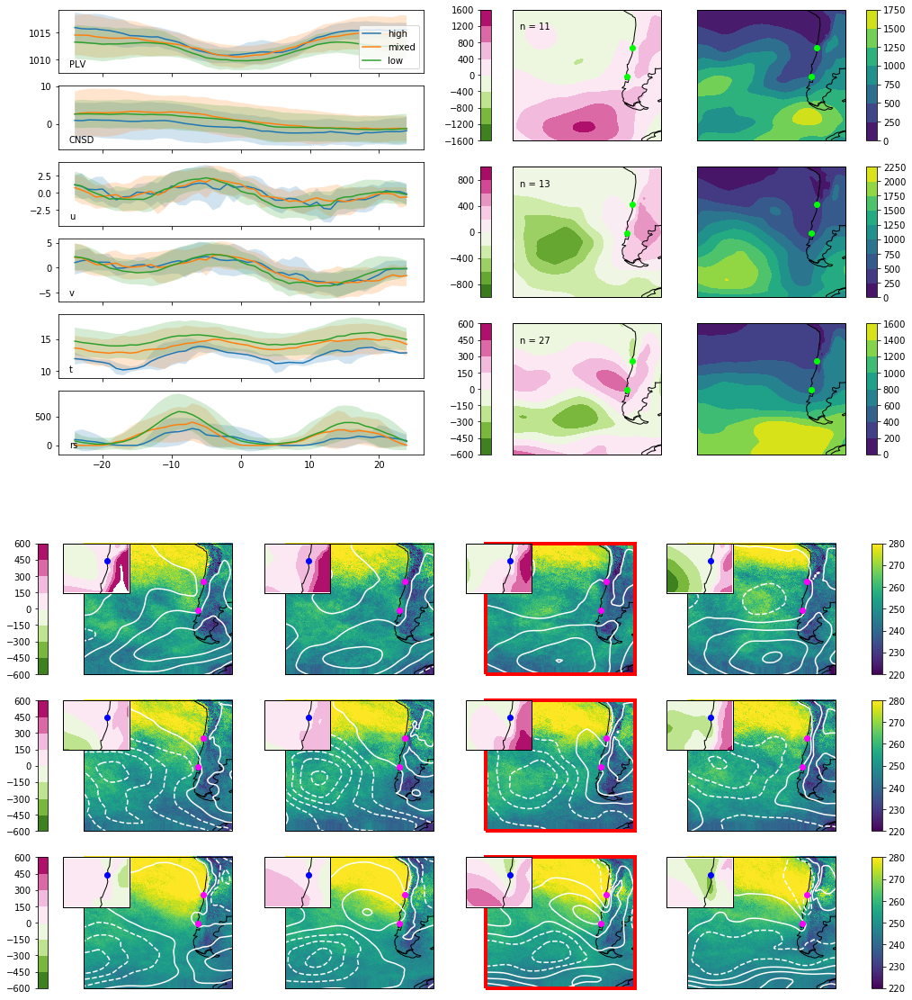

In [454]:
plt.figure(figsize=(16, 20))
label_plot(slp, c, l1, [np.arange(-1600, 1601, 400), 
                                 np.arange(-1000, 1001, 200), 
                                 np.arange(-600, 601, 150)], [np.arange(-600, 601, 150)]);

Here the relative depression events are categorized according to the mean cloud-top temperature in the vicinity of Punta Lengua de Vaca (*PLV*), in three clusters (*low* and *high* in the legends refers to low and high cloud tops, i.e. the inverse of the cloud top temperature). 

**Top left:** 48-hour composites centered on the culmination of the depression for the different classes of events (*high* / *low* cloud tops and in-between). *PLV* and *CNSD* refers to air pressure at *PLV* and Senda Darwin (*CNSD*), where at *CNSD*, the low-pass variability has been removed (low-pass Lanczos filter with 10-day cutoff period). All other variables are at *PLV*: *u* and *v* - the u, v components of the wind, with low pass variance removed (same filter); *t* - 2m temperature and *rs* - solar radiation.

**Maps:** All maps are arranged according to the *high*, *mixed* and *low* cloud categorization from top to bottom.   
**Top right:** Composites of SLP anomalies (from climatological mean) from the ERA-Interim reanalysis for the given events; *left* - mean, *right* - standard deviation. Dots mark *PLV* and *CNSD*, and the *n = ...* numbers give the counts for the given event class.

**Bottom:** Lagged composites for the same events, from -2 to +1 days in daily steps. The image plot shows the cloud-top temperature in K (legend to the right), whereas the contours show SLP, with the same contour levels as in the top right plots. The insets also show SLP, zoomed in onto the *PLV* area (blue dots) and with contours given by the legend on the left. The red outline denotes the plots of the culmination day ("lag 0").

### Notes

There is very little to distinguish the composites by as far as the *PLV* and *CNSD* station data is concerned. Most differences appear in temperater and solar radiation, but these are presumably more due to the difference in prevalence of cyclones and vaguadas over the cours of a year: Cyclones occur mostly in winter, when the temperatures are generally lower (and the solar radiation). The solar radiation is also likely to hide effects of the daily cycle (**is there phase-locking with either of the two event types?**).

In the SLP plots, the movement of cyclones is most prominently seen in the StDev plots rather than the means. Also prominent is the presence of the blocking high over the Bellingshause Sea, which is what sends migratory cyclones off their usually more southern tracks towards Coquimbo.

In [ ]:
plt.figure()
g = gs.GridSpec(1, 1)
ax = error_plot(relabel(var.index, dt, (q==0).astype(int)), gridspec=g[0])

In [287]:
def compositeXR(var, locs, period):
    dt = pd.Timedelta(period)
    ix = np.abs(np.expand_dims(var.XTIME, 2) - locs.values.reshape((1, 1, -1))) <= dt.asm8
    ix = ix * np.expand_dims(~np.isnat(var.XTIME), 2).repeat(ix.shape[2], 2)
    i = ix.reshape((-1, len(locs))).sum(0) > 0
    ix = ix[:, :, i]
    def series(x, s, loc):
        try:
            y = x.sel(start=s)
            c = (loc - s).values.astype('timedelta64[D]').astype(int)
            dt = (y.XTIME - loc).values.astype('timedelta64[h]').astype(int)
            return pd.DataFrame(y.values, index=dt, columns=[c]).dropna(0)
        except: return None
    def loc(k, loc):
        try:
            x = var.where(ix[:, :, k]).dropna('start', 'all').dropna('Time', 'all')
            return pd.concat([series(x, s, loc) for s in x.start], 1)
        except: return None
    x = pd.concat([loc(k, l) for k, l in enumerate(locs.values[i])], 1, keys=locs.values[i])
    x.columns = x.columns.swaplevel()
    return x.sort_index(1)

In [104]:
# NOTE: timeshift already applied to extracted dataset
TP = xr.open_dataset('../../data/WRF/3d/PSFC_T20.nc')
# round it to nearest hour (only a pandas.Series has the .dt accessor with rounding)
TP['XTIME'] = (TP.XTIME.dims, pd.Series(TP.XTIME.values.flatten()).dt.round('h').values.reshape(TP.XTIME.shape))

with pd.HDFStore('../../data/CEAZAMet/station_data_new.h5') as S:
    T2 = S['ta_c'].xs('prom', 1, 'aggr').drop('10', 1, level='elev')
DT = np.abs(TP['T2'] - 273.15 - WRF.align_stations(TP, T2))

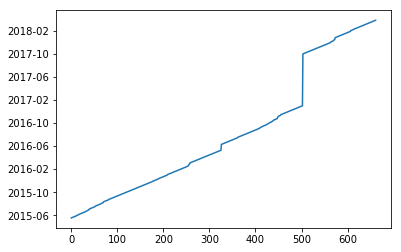

In [108]:
plt.figure()
plt.plot(TP.indexes['start'])

In [333]:
def error_plot(x, idx, labels, y=None, gridspec=gs.GridSpec(1, 1)[0], xlab='off', title=None):
    n = np.unique(labels).size
    g = gs.GridSpecFromSubplotSpec(1, n, subplot_spec=gridspec)
    ix = x.columns.get_level_values(1)
    I = lambda s: s[s>-1]
    
    ax = None
    for i in range(n):
        ax = plt.gcf().add_subplot(g[i], sharey=ax)
        z = x.iloc[:, I(ix.get_indexer_for(idx[labels==i]))]
        t = np.unique(z.columns.get_level_values(1))
        zm = z.mean(1, level=0)
        ax.plot(zm)
        if y is not None:
            ax.plot(y['dt'], y.sel(events=t).mean('events').values.flatten())
            plt.legend(np.r_[zm.columns, ['obs']], loc=4)
        else:
            plt.legend(zm.columns, loc=4)
        if i > 0:
            plt.setp(ax.get_yticklabels(), visible=False)
        
        ax.annotate('n = {}'.format(t.size), xy=(.05, .9), xycoords='axes fraction')
    
        if xlab=='off':
            plt.setp(ax.get_xticklabels(), visible=False)
            
    if title is not None:
        ax = plt.gcf().add_subplot(gridspec)
        ax.axis('off')
        ax.set_title(title)

/home/arno/Documents/code/conda/envs/bayes/lib/python3.6/site-packages/ipykernel_launcher.py:3: FutureWarning: In the future, 'NAT <= x' and 'x <= NAT' will always be False.
  This is separate from the ipykernel package so we can avoid doing imports until
/home/arno/Documents/code/conda/envs/bayes/lib/python3.6/site-packages/ipykernel_launcher.py:3: FutureWarning: In the future, 'NAT <= x' and 'x <= NAT' will always be False.
  This is separate from the ipykernel package so we can avoid doing imports until


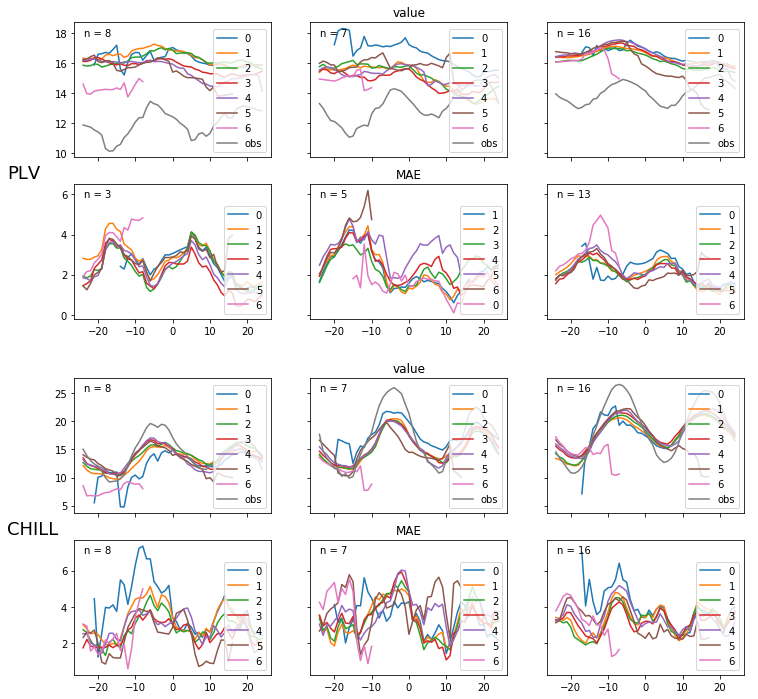

In [334]:
fig = plt.figure(figsize=(12, 12))
G = gs.GridSpec(2, 1, hspace=.2)

for i, s in enumerate(['PLV', 'CHILL']):
    g = gs.GridSpecFromSubplotSpec(2, 1, subplot_spec=G[i])
    wrf = compositeXR(TP['T2'].sel(station=s), idx, '1D').xs(slice(0, None), 1, 0, drop_level=False)
    dt = compositeXR(DT.sel(station=s), idx, '1D').xs(slice(0, None), 1, 0, drop_level=False)
    t2 = composite(T2[s], idx, '1D').squeeze()

    error_plot(wrf-273.15, idx, l1, y=t2, gridspec=g[0], title='value')
    error_plot(dt.abs(), idx, l1, gridspec=g[1], xlab='on', title='MAE')
    ax = fig.add_subplot(g[:, :])
    ax.axis('off')
    ax.annotate(s, xy=(-.1, .5), xycoords='axes fraction', xytext=(0, -8), textcoords='offset points', fontsize=18);

**T2** WRF simulation errors at two stations, *PLV* and Salamanca (*CHILL*). The top panel in each subplot (*value*) compares the simulations and station data directly in terms of their values, while the bottom panel (*MAE*) shows the mean absolute error. Shown are composits over classes of events (the columns, corresponding to the same event classification as in previous plots: *high*, *mixed* and *low* clouds), for 48-hour periods centered on each event culmination.

The *n = ...* insets show the number of events in each composite. Note that for the MAE calculation, the number may differ because the overlap between each simulation run and the station data is evaluated individually, whereas for the *value* plots all simulations that contain a given event date are counted, whether or not there is concurrent station data (However, only those culmination dates from the station data are used for which simulations exist.)

**Note:** The data for Salamanca is shown for comparison, but the event dates and composites are only computed on the basis of *PLV* data.

In [360]:
coq = Coquimbo()

In [364]:
z = clouds.sel(longitude=slice(-85, -65), latitude=slice(-40, -25))

In [411]:
zm = z.mean('time')
sm = slp.mean('time')

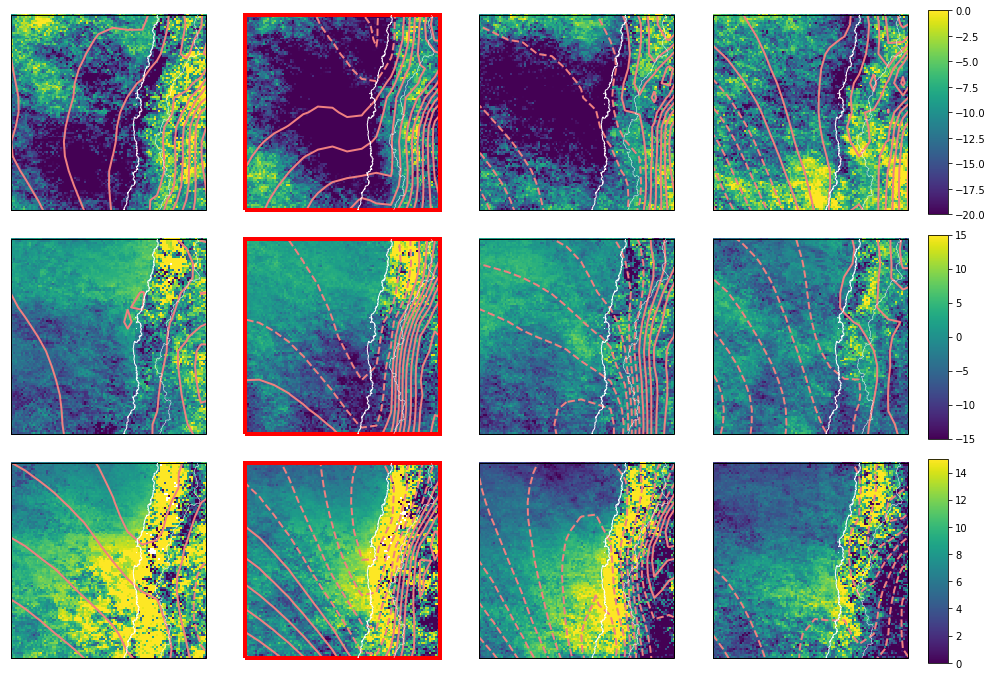

In [450]:
fig, axs = plt.subplots(3, 4, subplot_kw={'projection': crs.PlateCarree()}, figsize=(14, 12))
fig.subplots_adjust(left=.01, hspace=.1)

I = lambda x, y: x.sel(time=x.indexes['time'].intersection(y))

for i, norm in enumerate([(-20, 0), (-15, 15), (0, 15)]):
    for j in range(4):
        ax = axs[i, j]
        # the last index in l1 causes trouble for the last positive lag
        y = I(z, to_day(idx[l1==i] + pd.Timedelta(j - 1, 'D')))
        s = I(slp, to_day(idx[l1==i] + pd.Timedelta(j - 1, 'D') + pd.Timedelta('4h')))
        
        im = mpl.image.NonUniformImage(ax, norm=mpl.colors.Normalize(*norm), cmap='viridis')
        im.set_data(y.longitude, y.latitude, y.mean('time') - zm)
        im.set_extent([-78, -68, -35, -25])
        ax.images.append(im)
        ax.set_extent([-78, -68, -35, -25])
        ax.contour(s.lon, s.lat, s.mean('time') - sm, np.arange(-500, 501, 50), colors=['lightcoral'], linewidths=2)
        coq(ax, lines_only=True, colors=['w'])
        if j==1:
            ax.outline_patch.set_linewidth(4)
            ax.outline_patch.set_edgecolor('red')
    
    bb = ax.get_position()
    cax = fig.add_axes([bb.x1+.02, bb.y0, .02, bb.height])
    plt.colorbar(im, cax = cax)

Lag plots of an area centered on Coquimbo. The layout is as above: rows correspond to events with *high*, *mixed* and *low* clouds at *PLV*. The images show cloud-top temperature *anomalies*, the contours SLP anomalies. The lags are from -1 to +2 days now (red box is day 0, as above).

The disturbances seem indeed to travel southward (bottom row).

## Wavelets

In [460]:
cwt_plv = pycwt.cwt(pi['PLV'].values.flatten(), dt=1/24)
cwt_cnsd = pycwt.cwt(pi['CNSD'].values.flatten(), dt=1/24)

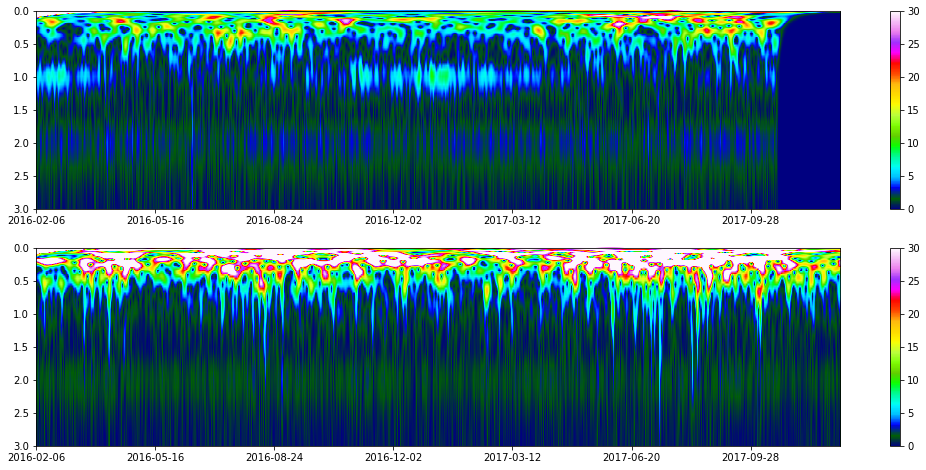

In [463]:
fig, axs = plt.subplots(2, 1, figsize=(18, 8))

for i, x in enumerate([cwt_plv, cwt_cnsd]):
    im = mpl.image.NonUniformImage(axs[i], interpolation='bilinear', 
                                   norm=mpl.colors.Normalize(0, 30), cmap='gist_ncar')
    im.set_data(mpl.dates.date2num(pi.index.to_pydatetime()), x[2], np.abs(x[0]))
    im.set_extent((736000, 736675, 3, 0))
    axs[i].images.append(im)
    axs[i].xaxis.set_major_formatter(mpl.dates.DateFormatter('%Y-%m-%d'))
    plt.colorbar(im, ax=axs[i])

Wavelet power spectra (Morlet wavelet) for *PLV* (top) and *CNSD* (bottom). The higher power at the daily frequency can be clearly seen at *PLV*, together with the fact that it's more pronounced during the summer months. Synoptic activity, on the other hand, is more pronounce during the winter months, in both locations. The semi-diurnal tides can also be seen and are equally more pronounced at *PLV*.

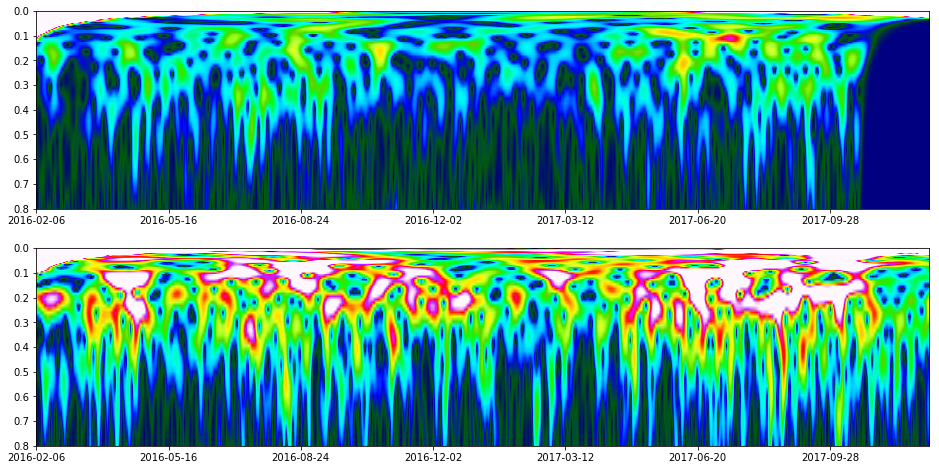

In [464]:
fig, axs = plt.subplots(2, 1, figsize=(16, 8))

for i, x in enumerate([cwt_plv, cwt_cnsd]):
    im = mpl.image.NonUniformImage(axs[i], interpolation='bilinear', 
                                   norm=mpl.colors.Normalize(0, 50), cmap='gist_ncar')
    im.set_data(mpl.dates.date2num(pi.index.to_pydatetime()), x[2], np.abs(x[0]))
    im.set_extent((736000, 736675, .8, 0))
    axs[i].images.append(im)
    axs[i].xaxis.set_major_formatter(mpl.dates.DateFormatter('%Y-%m-%d'))

Same as above, but restricted to lower frequencies (*PLV* top, *CNSD* bottom). *CNSD* has more power at lower frequencies - but note that we're dealing with a short piece and the ENSO frequencies are not well resolved. **Note the relatively higher power around the 10 days periodicity in the winter of 2017, when we had a lot of rain!**

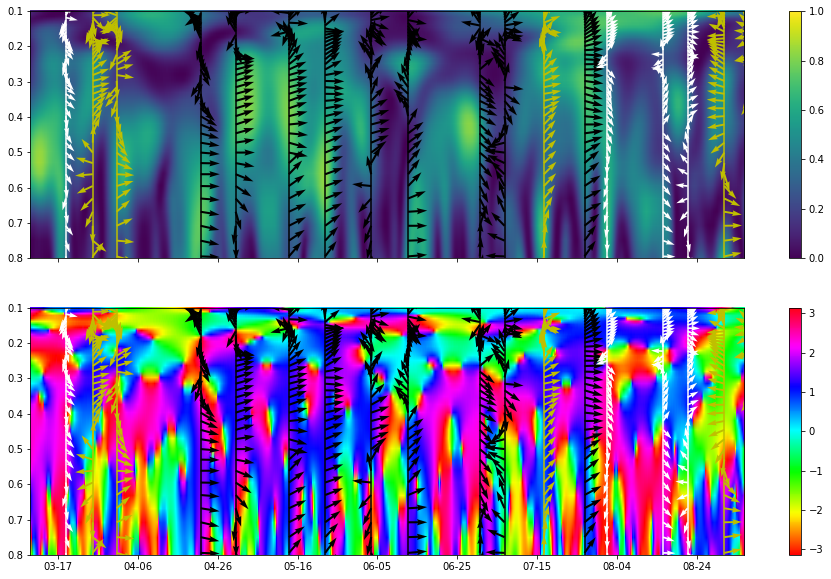

In [472]:
x = pi['2016-02': '2016-10']
wct = pycwt.wct(*x.values.T, dt=1/24, sig=False)
# following pycwt to example script (sample_xwt.py)
angle = 0.5 * np.pi - wct[1] 
u, v = np.cos(angle), np.sin(angle)

dt = lambda d: mpl.dates.date2num(datetime(*d))

l, = np.where((wct[3] > 0.1) & (wct[3] < 1))
t = mpl.dates.date2num(x.index.to_pydatetime())

fig, axs = plt.subplots(2, 1, figsize=(16, 10))

for i, (norm, cmap) in enumerate(zip([(0, 1), (-np.pi, np.pi)], ['viridis', 'hsv'])):
    plt.sca(axs[i])
    im = mpl.image.NonUniformImage(axs[i], interpolation='bilinear', 
                                   norm=mpl.colors.Normalize(*norm), cmap=cmap)
    im.set_data(t, wct[3], wct[i])
    im.set_extent([dt((2016, 3, 10)), dt((2016, 9, 5)), .8, .1])
    axs[i].images.append(im)

    plt.colorbar(im, ax=axs[i])
    
    for s, col in enumerate(['k', 'y', 'w']):
        j = idx[l1==s]
        k = x.index.get_indexer_for(j)
        plt.quiver(t[k], wct[3][l], u[l, :][:, k], v[l, :][:, k], color=col)
        axs[i].vlines(t[k], 0, 12, colors=[col])
    
    plt.ylim(.8, .1)
    plt.xlim(*[mpl.dates.date2num(datetime(*d)) for d in [(2016, 3, 10), (2016, 9, 5)]])

axs[1].xaxis.set_major_formatter(mpl.dates.DateFormatter('%m-%d'))
axs[0].set_xticklabels([]);

Wavelet coherence and phase between *PLV* and *CNSD* air pressure, for a smaller time subsection. Upper panel shows coherence, lower panel and arrows relative phase. Up arrow denotes in phase, down out of phase, right leading and left trailing <cite data-cite="2031184/32ZAWXX3"></cite>. The white lines correspond to manually categorized coastal lows, the black ones to migrating cyclones. **Note, however, that this classification is quite subjective (it's based on SLP fields from ERA) and might be wrong.**

The migratory cyclones seem to be characterized by:
1. lower frequencies (than the coastal lows)
2. leading in phase **at PLV**

The coastal lows, on the other hand, seem to have more variable phase across the frequency spectrum. **This may imply that they're generally more variable and less easy to pin down to a canonical life cycle.**

The lead at *PLV* makes intuitive sense since **if** a migratory cyclone is headed towards Coquimbo (usually because there is a blocking high over the Bellingshausen Sea), it will arrive there **before** its effects are felt at *CNSD*.

In reality, it appears that migratory cyclones and vaguadas can occurr in mixed forms, too, and that migratory cyclones can be "squished" against the mountains by following anticyclones, which at some point in their life cycle will make them appear very similar to vaguadas.

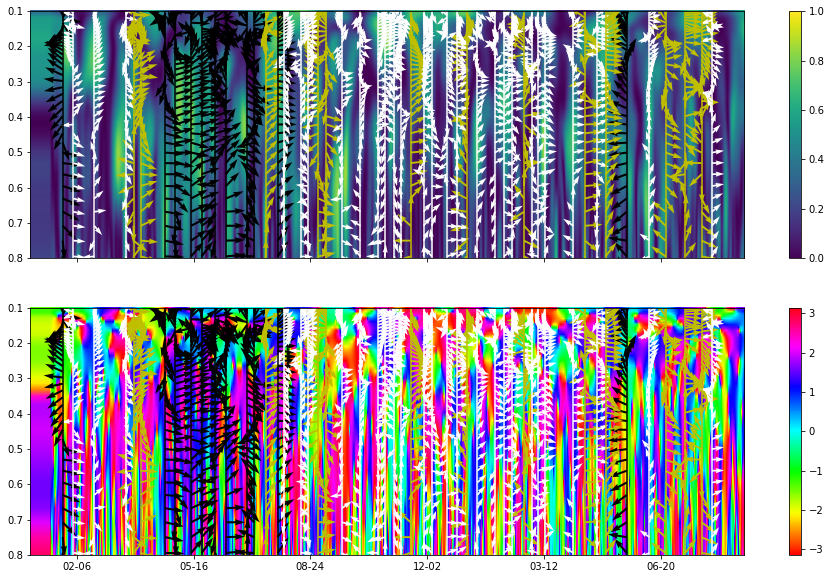

In [473]:
x = pi
wct = pycwt.wct(*x.values.T, dt=1/24, sig=False)
# following pycwt to example script (sample_xwt.py)
angle = 0.5 * np.pi - wct[1] 
u, v = np.cos(angle), np.sin(angle)

dt = lambda d: mpl.dates.date2num(datetime(*d))

l, = np.where((wct[3] > 0.1) & (wct[3] < 1))
t = mpl.dates.date2num(x.index.to_pydatetime())

fig, axs = plt.subplots(2, 1, figsize=(16, 10))

for i, (norm, cmap) in enumerate(zip([(0, 1), (-np.pi, np.pi)], ['viridis', 'hsv'])):
    plt.sca(axs[i])
    im = mpl.image.NonUniformImage(axs[i], interpolation='bilinear', 
                                   norm=mpl.colors.Normalize(*norm), cmap=cmap)
    im.set_data(t, wct[3], wct[i])
    im.set_extent([dt((2016, 3, 10)), dt((2016, 9, 5)), .8, .1])
    axs[i].images.append(im)

    plt.colorbar(im, ax=axs[i])
    
    for s, col in enumerate(['k', 'y', 'w']):
        j = idx[l1==s]
        k = x.index.get_indexer_for(j)
        plt.quiver(t[k], wct[3][l], u[l, :][:, k], v[l, :][:, k], color=col)
        axs[i].vlines(t[k], 0, 12, colors=[col])
    
    plt.ylim(.8, .1)
#     plt.xlim(*[mpl.dates.date2num(datetime(*d)) for d in [(2016, 3, 10), (2016, 9, 5)]])

axs[1].xaxis.set_major_formatter(mpl.dates.DateFormatter('%m-%d'))
axs[0].set_xticklabels([]);

Same as above but for a longer timespan.

In [479]:
S = pd.HDFStore('../../data/CEAZAMet/station_data_new.h5')

In [521]:
P = S['pa_hpa'].xs('prom', 1, 'aggr')[['PLV', 'PICH']].dropna(0, 'all').resample('h').first()
C = composite(P, idx[l1==2], '1D')

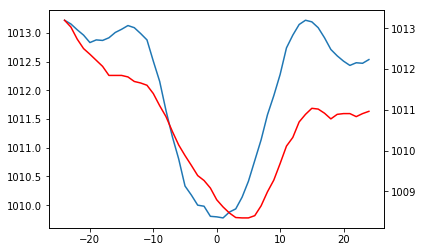

In [522]:
plt.figure()
plt.plot(C['dt'], C.isel(var=0).mean('events').squeeze())
plt.gca().twinx()
plt.plot(C['dt'], C.isel(var=1).mean('events').squeeze(), 'r')

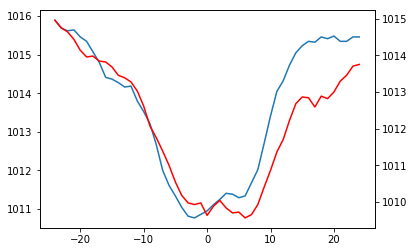

In [523]:
C = composite(P, idx[l1==0], '1D')
plt.figure()
plt.plot(C['dt'], C.isel(var=0).mean('events').squeeze())
plt.gca().twinx()
plt.plot(C['dt'], C.isel(var=1).mean('events').squeeze(), 'r')